
# Working with Netcd4-python data: Xarray tutorial

In this tutorial, we will use the features of the Python xarray library to process and analyze Netcdf files.

To install the library under anaconda:

$ conda install xarray


Here is an example of structure of a Netcdf file under xarray:
   
<b> DataArray </b>

xarray.DataArray is xarray’s implementation of a labeled, multi-dimensional array. It has several key properties:

<table border="1" class="docutils">
<colgroup>
<col width="27%">
<col width="57%">
</colgroup>
<tbody valign="top">
<tr><td><tt class="docutils literal"><span class="pre">values</span></tt></td>
<td> a numpy.ndarray holding the array’s values</td>
</tr>
<tr><td><tt class="docutils literal"><span class="pre">dims</span></tt></td>
<td>dimension names for each axis (e.g., ('x', 'y', 'z','time'))</td>
</tr>
<tr><td><tt class="docutils literal"><span class="pre">coords</span></tt></td>
<td>a dict-like container of arrays (coordinates) that label each point (e.g., 1-dimensional arrays of numbers, datetime objects or strings)</td>
</tr>
<tr><td><tt class="docutils literal"><span class="pre">attrs</span></tt></td>
<td>an OrderedDict to hold arbitrary metadata (attributes)</td>
</tr>
</tbody>
</table>


<b> DataSet </b>

xarray.Dataset is xarray’s multi-dimensional equivalent of a DataFrame. It is a dict-like container of labeled arrays (DataArray objects) with aligned dimensions. It is designed as an in-memory representation of the data model from the netCDF file format.


xarray.DataSet is a collection of DataArrays. Each NetCDF file contains a DataSet.

## 1- Open a Netcdf file

We will open and store the data of a Netcdf file in a Dataset.

First we need to import librairies and create aliases.

In [2]:
import xarray as xr
import warnings; warnings.filterwarnings(action='ignore')
from matplotlib import pyplot as plt
%matplotlib inline

In [3]:
model='DAYMET_1km_subset_BV'
yi = 2017
yf = 2017
tot=(yf-yi)+1
#########################################################
rep='K:/DATA/DONNEES_AMERIQUE_DU_NORD/DAYMET/CLEMENCE/BV/'

In [119]:
def HWDI(ds):
    actualCount = 0
    sequence = 0
    i = 0
    while (i <= len(ds.tmin)-1):
             while (i+1 < len(ds.tmin)) and (ds.tmin[i] >= 20) and (ds.tmin[i+1] >= 20) and (ds.tmax[i] >= 33) and (ds.tmax[i+1] >= 33) and (ds.hum[i] >= 40) and (ds.hum[i+1] >= 40):
                 i += 1
                 if actualCount == 0 :
                    actualCount += 2
                 else:
                    actualCount += 1
                 
             if actualCount == 0:
                 i += 1
                 actualCount = 0
             elif (actualCount == 1) or  (actualCount == 2) :
                 actualCount = 0
             elif actualCount >= 3:
                  sequence += 1 
                  actualCount = 0
                 
    return(sequence)            

In [114]:
for year in range(yi,yf+1): 
    data = rep + model + '_tmax_'+str(year) +'_*.nc4'
    tmax = xr.open_mfdataset(data)    
    
    data = rep + model + '_tmin_'+str(year) +'_*.nc4'
    tmin = xr.open_mfdataset(data)
     
    data = rep + model + '_humidex_'+str(year) +'_*.nc4'
    hum = xr.open_mfdataset(data)
   
    DS = xr.merge([tmax,tmin, hum])

    DS_date_range = DS.sel(time=slice(str(year) + '-05-01', str(year) + '-09-30'))
    DS_date_range.to_netcdf('./tmp.nc')                   

In [115]:
DS_date_range

<xarray.Dataset>
Dimensions:            (time: 153, x: 702, y: 678)
Coordinates:
  * x                  (x) float32 1276.75 1277.75 1278.75 ... 1976.75 1977.75
  * y                  (y) float32 992.0 991.0 990.0 989.0 ... 317.0 316.0 315.0
  * time               (time) datetime64[ns] 2017-05-01T12:00:00 ... 2017-09-30T12:00:00
Data variables:
    Lambert_Conformal  (time) |S1 b'' b'' b'' b'' b'' ... b'' b'' b'' b'' b''
    lat                (time, y, x) float32 dask.array<shape=(153, 678, 702), chunksize=(31, 678, 702)>
    lon                (time, y, x) float32 dask.array<shape=(153, 678, 702), chunksize=(31, 678, 702)>
    tmax               (time, y, x) float32 dask.array<shape=(153, 678, 702), chunksize=(31, 678, 702)>
    tmin               (time, y, x) float32 dask.array<shape=(153, 678, 702), chunksize=(31, 678, 702)>
    humidex            (time, y, x) float32 dask.array<shape=(153, 678, 702), chunksize=(31, 678, 702)>

In [121]:
res = xr.apply_ufunc(HWDI, DS_date_range)

AttributeError: 'numpy.ndarray' object has no attribute 'values'

In [90]:
import pandas as pd
import numpy as np
def special_mean(x, drop_min=False):
    s = np.sum(x)
    n = len(x)
    if drop_min:
        s = s - x.min()
    n -= 1
    return s/n

times = pd.date_range('2019-01-01', '2019-01-10', name='time')

data = xr.DataArray(np.random.rand(10, 8, 8), dims=["time", "y", "x"], coords={'time': times})
data = data.chunk({'time':10, 'x':1, 'y':1})

res = xr.apply_ufunc(special_mean, data, input_core_dims=[["time"]], kwargs={'drop_min': True}, dask = 'allowed', vectorize = True)

In [92]:
res

<xarray.DataArray (y: 8, x: 8)>
array([[0.673572, 0.511834, 0.539252, 0.620956, 0.515924, 0.53588 , 0.588294,
        0.667379],
       [0.598307, 0.474078, 0.571221, 0.616789, 0.738941, 0.668911, 0.580246,
        0.618088],
       [0.536104, 0.726665, 0.613522, 0.598151, 0.400231, 0.509276, 0.421162,
        0.465128],
       [0.472006, 0.458053, 0.510542, 0.491248, 0.587487, 0.487423, 0.499887,
        0.50774 ],
       [0.484691, 0.642497, 0.535127, 0.786411, 0.644228, 0.273757, 0.441443,
        0.540286],
       [0.505417, 0.426951, 0.665259, 0.39499 , 0.459796, 0.584785, 0.681992,
        0.421379],
       [0.581077, 0.576362, 0.643021, 0.487594, 0.606609, 0.637102, 0.517352,
        0.629526],
       [0.427334, 0.581628, 0.505133, 0.659458, 0.413673, 0.461646, 0.648435,
        0.533553]])
Dimensions without coordinates: y, x

In [111]:
def my_function(x):
    mask = (x.prcp < 1 )[:,0]   #mask dry days i.e. days with daily rain < 1mm
    dryday_num = mask.groupby( ~mask.cumsum() ).sum() # calculate number of consecutive dry days (i.e. number of consecutive <True> values in a time-series) 
     
    index = np.where((((mask.shift(time=-1).fillna(False)) - mask)==-1) & (mask==True))[0] # shift the mask by one time step relative to original and calculate the difference between them to identify last <True> index in a dry day sequence
    dry_days = x.prcp[:,0].copy(); dry_days[:] = 0.0 #create an empty array of dry days
    dry_days[index] = dryday_num[dryday_num>0]  # store the number of dry days in the last day of every dry day period 
    return dry_days

In [107]:
data = rep + model + '_prcp_'+str(year) +'_*.nc4'
precip = xr.open_mfdataset(data)
precip

<xarray.Dataset>
Dimensions:            (time: 365, x: 702, y: 678)
Coordinates:
  * x                  (x) float32 1276.75 1277.75 1278.75 ... 1976.75 1977.75
  * y                  (y) float32 992.0 991.0 990.0 989.0 ... 317.0 316.0 315.0
  * time               (time) datetime64[ns] 2017-01-01T12:00:00 ... 2017-12-31T12:00:00
Data variables:
    Lambert_Conformal  (time) |S1 b'' b'' b'' b'' b'' ... b'' b'' b'' b'' b''
    lat                (time, y, x) float32 dask.array<shape=(365, 678, 702), chunksize=(31, 678, 702)>
    lon                (time, y, x) float32 dask.array<shape=(365, 678, 702), chunksize=(31, 678, 702)>
    prcp               (time, y, x) float32 dask.array<shape=(365, 678, 702), chunksize=(31, 678, 702)>

In [108]:
pr = precip.isel(time=slice(0,20))
print (pr)

<xarray.Dataset>
Dimensions:            (time: 20, x: 702, y: 678)
Coordinates:
  * x                  (x) float32 1276.75 1277.75 1278.75 ... 1976.75 1977.75
  * y                  (y) float32 992.0 991.0 990.0 989.0 ... 317.0 316.0 315.0
  * time               (time) datetime64[ns] 2017-01-01T12:00:00 ... 2017-01-20T12:00:00
Data variables:
    Lambert_Conformal  (time) |S1 b'' b'' b'' b'' b'' ... b'' b'' b'' b'' b''
    lat                (time, y, x) float32 dask.array<shape=(20, 678, 702), chunksize=(20, 678, 702)>
    lon                (time, y, x) float32 dask.array<shape=(20, 678, 702), chunksize=(20, 678, 702)>
    prcp               (time, y, x) float32 dask.array<shape=(20, 678, 702), chunksize=(20, 678, 702)>


In [109]:
stacked = pr.stack(allpoints=['x','y'])
stacked

<xarray.Dataset>
Dimensions:            (allpoints: 475956, time: 20)
Coordinates:
  * time               (time) datetime64[ns] 2017-01-01T12:00:00 ... 2017-01-20T12:00:00
  * allpoints          (allpoints) MultiIndex
  - x                  (allpoints) float64 1.277e+03 1.277e+03 ... 1.277e+03
  - y                  (allpoints) float64 992.0 991.0 990.0 ... 964.0 963.0
Data variables:
    Lambert_Conformal  (time) |S1 b'' b'' b'' b'' b'' ... b'' b'' b'' b'' b''
    lat                (time, allpoints) float32 dask.array<shape=(20, 475956), chunksize=(20, 475956)>
    lon                (time, allpoints) float32 dask.array<shape=(20, 475956), chunksize=(20, 475956)>
    prcp               (time, allpoints) float32 dask.array<shape=(20, 475956), chunksize=(20, 475956)>

In [112]:
dry_day_number_stacked = stacked.groupby('allpoints').apply(my_function) # run my_function over every grid pixel 
dry_day_num = dry_day_num_stacked.unstack('allpoints')

TypeError: unsupported operand type(s) for -: 'Array' and 'Array'

In [ ]:
for year in range(yi,yf+1):
  
    data = rep + model + '_tmax_'+str(year) +'_*.nc4'
    tmax = xr.open_mfdataset(data)
     
    data = rep + model + '_tmin_'+str(year) +'_*.nc4'
    tmin = xr.open_mfdataset(data)
     
    data = rep + model + '_humidex_'+str(year) +'_*.nc4'
    hum = xr.open_mfdataset(data)
   
    DS = xr.merge([tmax,tmin, hum])

    DS_date_range = DS.sel(time=slice(str(year) + '-05-01', str(year) + '-09-30'))
    DS_date_range.to_netcdf('./tmp.nc')                   
    # Calcul de l'indice 
       
    nt=0
    IND = np.zeros((tot,678,702),dtype=float)
    ###### ouverture et lecture des fichiers Netcdf
    nc_Modc=Dataset('./tmp.nc','r')
    lats=nc_Modc.variables['lat'][:]
    lons=nc_Modc.variables['lon'][:]
    tmax=nc_Modc.variables['tmax'][:]
    tmin=nc_Modc.variables['tmin'][:]
    humidex=nc_Modc.variables['humidex'][:]
    
    
    ###### boucle sur tous les points de grille et calcul de l'indice
    for ni in range(0, len(tmax[0])):
        for nj in range(0, len(tmax[0][0])):           
            IND[nt,ni,nj]=HWDI(tmin[:,ni,nj],tmax[:,ni,nj],humidex[:,ni,nj], 20, 33, 40, 3 )
            description='Heat Wave Index'
            unite='days'

        ###### Écriture du fichier Netcdf en sortie
    C = Dataset('./output/python/'+model+'_HWDI_'+str(yi)+'-'+str(yf)+'_Mai_Septembre.nc', 'w')
    C.description = 'Heat Wave Index'
    C.conventions = 'CF-1.0'  
    C.model_id = model
    C.institution = 'UQAM - ESCER Center, University of Quebec in Montreal'
    C.contact = 'Guillaume Dueymes'
    ########################################
    # Dimensions
    C.createDimension('x', len(tmin[0][0]))
    C.createDimension('y', len(tmin[0]))
    C.createDimension('time', tot)
    
    var=C.createVariable('HWDI', np.float32, ('time','y','x')) 
    var.long_name = str(description)
    var.unit = str(unite)
    lat=C.createVariable('lat', np.float32, ('y','x'))
    lon=C.createVariable('lon', np.float32, ('y','x')) 
    
    time = C.createVariable('time', np.float64, ('time',))
    time.long_name = 'time'
    
    nc_Modr=Dataset(rep + model + '_tmin_'+str(year) +'_01.nc4','r')
    lats=nc_Modr.variables['lat'][:]
    lons=nc_Modr.variables['lon'][:]

    
    for var in ['lon','lat','time']:
        for att in nc_Modr.variables[var].ncattrs():
            setattr(C.variables[var],att,getattr(nc_Modr.variables[var],att))
    
    time[:]=range(1,nt+1)
    lat[:,:] = lats
    lon[:,:] = lons
    C.variables['HWDI'][:,:,:] = IND[::]
    C.close()   

In [11]:
 ds = xr.open_mfdataset('anomalie_ensemble_rcp85_CORDEX_NAM44_Mean_tasmin_2071-2100_1971-2000_12.nc')

In [12]:
ds

<xarray.Dataset>
Dimensions:      (time: 1, x: 155, y: 130)
Coordinates:
    lon          (y, x) float32 dask.array<shape=(130, 155), chunksize=(130, 155)>
    lat          (y, x) float32 dask.array<shape=(130, 155), chunksize=(130, 155)>
  * time         (time) float64 1.0
Dimensions without coordinates: x, y
Data variables:
    Mean_tasmin  (time, y, x) float32 dask.array<shape=(1, 130, 155), chunksize=(1, 130, 155)>

We then need to extract latitudes and longitudes values and compute a 2D matrix. 

In [13]:
lat2d =  ds['lat'][0].values
lon2d =  ds['lon'][0].values
#lon2d, lat2d = np.meshgrid(Imp_Lons, Imp_Lats)

In [14]:
lon2d

array([-127.155334, -126.79516 , -126.43392 , -126.071625, -125.70828 ,
       -125.34389 , -124.97845 , -124.61198 , -124.24447 , -123.87594 ,
       -123.50638 , -123.13581 , -122.76424 , -122.39166 , -122.01809 ,
       -121.64353 , -121.268   , -120.891495, -120.51403 , -120.13561 ,
       -119.75625 , -119.37595 , -118.99473 , -118.612595, -118.22955 ,
       -117.84561 , -117.46079 , -117.0751  , -116.688545, -116.30114 ,
       -115.912895, -115.523834, -115.13395 , -114.74327 , -114.3518  ,
       -113.95956 , -113.56656 , -113.172806, -112.77833 , -112.38313 ,
       -111.98723 , -111.59064 , -111.19338 , -110.79546 , -110.396904,
       -109.99772 , -109.59792 , -109.19753 , -108.79657 , -108.39505 ,
       -107.99299 , -107.59039 , -107.1873  , -106.783714, -106.37966 ,
       -105.97515 , -105.570206, -105.16485 , -104.75909 , -104.35295 ,
       -103.94646 , -103.53962 , -103.13246 , -102.725006, -102.31726 ,
       -101.909256, -101.50101 , -101.09254 , -100.68387 , -100.

We open the shapefile file with Geopandas library.

In [7]:
from osgeo import ogr
import geopandas as gpd
import numpy as np

shapes = gpd.read_file("BV_Outaouais_masque.shp")
list(shapes.columns.values)

['FID_BV_Out',
 'NO_SEQ_COU',
 'NO_COURS_D',
 'NOM_COURS_',
 'NIVEAU_BAS',
 'NO_REG_HYD',
 'ECHELLE',
 'DAT_MAJ',
 'ENTITE',
 'SUP_KM2',
 'SHAPE_Leng',
 'SHAPE_Area',
 'DATEVAL',
 'NOMJEUDONN',
 'CDPROV_1',
 'CDPROV_2',
 'CDPROV_3',
 'CDPROV_4',
 'EDITION',
 'VERSION',
 'EXT_MIN_X',
 'EXT_MIN_Y',
 'EXT_MAX_X',
 'EXT_MAX_Y',
 'X',
 'Y',
 'Z',
 'ZZ',
 'FID_BV_o_1',
 'Id',
 'geometry']

In [8]:
shapes

,FID_BV_Out,NO_SEQ_COU,NO_COURS_D,NOM_COURS_,NIVEAU_BAS,NO_REG_HYD,ECHELLE,DAT_MAJ,ENTITE,SUP_KM2,...,EXT_MIN_Y,EXT_MAX_X,EXT_MAX_Y,X,Y,Z,ZZ,FID_BV_o_1,Id,geometry
0,465,0.0,None,Upper Ottawa-Kipawa,0,None,None,None,None,0.0,...,266663.780525,-775397.3564,480634.635086,0.0,0.0,0.0,0.0,-1,0,(POLYGON ((-427898.3630000001 165047.838100004...


In [9]:
shapes.loc[0, 'geometry']

We want in our study to extract information inside BV Outaouais.  shapefile.

In [70]:
ds2 = xr.open_dataset('mask_buff_1km.nc')
mask = ds2['mask'][0, :, :].values

In [71]:
data = ds['swe'].where(mask==1)

In [72]:
data

<xarray.DataArray 'swe' (time: 61, y: 678, x: 702)>
dask.array<shape=(61, 678, 702), dtype=float32, chunksize=(31, 678, 702)>
Coordinates:
  * x        (x) float32 1276.75 1277.75 1278.75 ... 1975.75 1976.75 1977.75
  * y        (y) float32 992.0 991.0 990.0 989.0 ... 318.0 317.0 316.0 315.0
  * time     (time) datetime64[ns] 2017-03-01T12:00:00 ... 2017-04-30T12:00:00
Attributes:
    long_name:     snow water equivalent
    units:         kg/m2
    grid_type:     lcc2
    grid_mapping:  Lambert_Conformal
    cell_methods:  area: mean time: mean
    _ChunkSizes:   [   1 1000 1000]

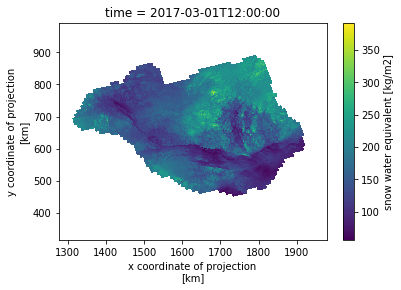

In [75]:
data[0].plot()

In [80]:
import cartopy.crs as ccrs
import cartopy.feature as cfeat
def make_figure():
    fig = plt.figure(figsize=(22, 12))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

    # generate a basemap with country borders, oceans and coastlines
    ax.add_feature(cfeat.LAND)
    ax.add_feature(cfeat.OCEAN)
    ax.add_feature(cfeat.COASTLINE)
    ax.add_feature(cfeat.BORDERS, linestyle='dotted')

In [86]:
data

<xarray.DataArray 'swe' (time: 61, y: 678, x: 702)>
dask.array<shape=(61, 678, 702), dtype=float32, chunksize=(31, 678, 702)>
Coordinates:
  * x        (x) float32 1276.75 1277.75 1278.75 ... 1975.75 1976.75 1977.75
  * y        (y) float32 992.0 991.0 990.0 989.0 ... 318.0 317.0 316.0 315.0
  * time     (time) datetime64[ns] 2017-03-01T12:00:00 ... 2017-04-30T12:00:00
Attributes:
    long_name:     snow water equivalent
    units:         kg/m2
    grid_type:     lcc2
    grid_mapping:  Lambert_Conformal
    cell_methods:  area: mean time: mean
    _ChunkSizes:   [   1 1000 1000]

In [106]:
ds.sel(time='2017-03-30').swe[0]

<xarray.DataArray 'swe' (y: 678, x: 702)>
dask.array<shape=(678, 702), dtype=float32, chunksize=(678, 702)>
Coordinates:
  * x        (x) float32 1276.75 1277.75 1278.75 ... 1975.75 1976.75 1977.75
  * y        (y) float32 992.0 991.0 990.0 989.0 ... 318.0 317.0 316.0 315.0
    time     datetime64[ns] 2017-03-30T12:00:00
Attributes:
    long_name:     snow water equivalent
    units:         kg/m2
    grid_type:     lcc2
    grid_mapping:  Lambert_Conformal
    cell_methods:  area: mean time: mean
    _ChunkSizes:   [   1 1000 1000]

In [109]:
import cartopy.crs as ccrs
import cartopy.feature as cfeat
def make_figure():
    fig = plt.figure(figsize=(22, 12))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

    # generate a basemap with country borders, oceans and coastlines
    ax.add_feature(cfeat.LAND)
    ax.add_feature(cfeat.OCEAN)
    ax.add_feature(cfeat.COASTLINE)
    ax.add_feature(cfeat.BORDERS, linestyle='dotted')
    return fig, ax


In [ ]:
_, ax = make_figure()
# plot the temperature field
ds.sel(time='2017-03-30').swe[0].plot()

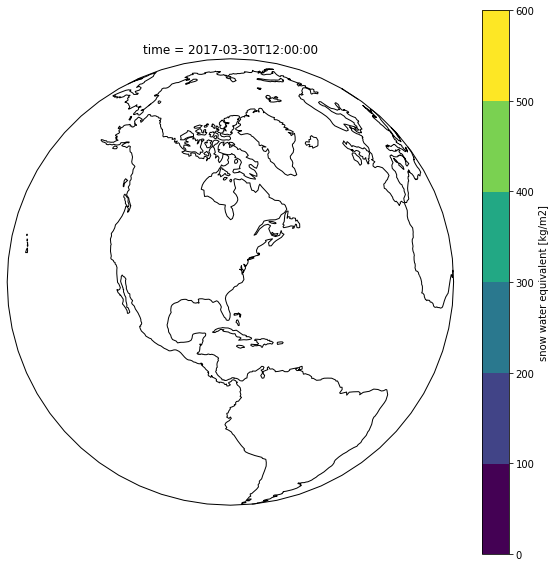

In [107]:
import cartopy.crs as ccrs
fig=plt.figure(figsize=(10,10), frameon=True) 
ax = plt.axes(projection=ccrs.Orthographic(-80, 35))
ds.sel(time='2017-03-30').swe[0].plot.contourf(ax=ax, transform=ccrs.PlateCarree());
ax.set_global(); ax.coastlines();

##  5- Last example using Xarray: 

In this section, We will calculate the seasonal accumulation of the precipitation, extract a region, plot the domain and record our result in Netcdf:

In [ ]:
# Let's open cera20c_enda_ep_PR_*.nc netcdf files 
multi_dataDIR = './DATA/CERA20C/cera20c_enda_ep_PR_*.nc'
array = xr.open_mfdataset(multi_dataDIR)
array.tp

All Netcdf files are stored in DataArray container, we can now group our Datasets by season, apply a simple sum() method over time and then change units from meters to mm.

In [ ]:
array_season = array.groupby('time.season').sum('time')*1000
array_season

We want to extract a specific domain delimited: 
    - latitude boundaries: 50N to 70N
    - longitude boudaries: 250E to 310E
    
We finally want to extract winter season. 

In [ ]:
lat_bnd = [70, 50]
lon_bnd = [250, 310]
subset_season_DJF = array_season.sel(season = 'DJF', longitude=slice(*lon_bnd), latitude=slice(*lat_bnd),)
subset_season_DJF

Let's save the Dataset to Netcdf. 

In [ ]:
dataDIR = './DATA/subset_season.nc'
subset_season_DJF.to_netcdf(dataDIR)

We can call our make_figure() function to quick plot our Dataset. 

In [ ]:
_, ax = make_figure()
# plot the temperature field
subset_season_DJF.tp.plot.pcolormesh(vmin=0, vmax=200, cmap='Spectral',add_colorbar=True, extend='both')

In [ ]:
array_season

In [2]:
import xarray as xr
multi_dataDIR = 'D:/ANUSPLIN_10km/Netcdf/tasmin/ANUSPLIN_10km_tasmin_ll_*_01_d.nc'
TAS2 = xr.open_mfdataset(multi_dataDIR)

D:\Utilisateurs\guillaume\Anaconda3\lib\site-packages\dask\config.py:168: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}
D:\Utilisateurs\guillaume\Anaconda3\lib\site-packages\distributed\config.py:20: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  defaults = yaml.load(f)


ValueError: unable to decode time units 'days since  1950-01-00 00:00:00' with calendar 'proleptic_gregorian'. Try opening your dataset with decode_times=False.